# Input Functions, esp. for [15O]Oxygen and Mintun1984 Models
## Setup

In [15]:
# system functions that are always useful to have
import time, sys, os
from pprint import pprint

# basic numeric setup
import numpy as np

from Boxcar import Boxcar
from RadialArtery import RadialArtery
from Mintun1984ModelAndArtery import Mintun1984ModelAndArtery

In [40]:
# define data & models
petdir = os.path.join(os.getenv("HOME"), "PycharmProjects", "dynesty", "idif2024", "data", "ses-20210421150523", "pet")
petdir2 = os.path.join(os.getenv("HOME"), "PycharmProjects", "dynesty", "idif2024", "data", "ses-20210421154248", "pet")
idif = os.path.join(petdir, "sub-108293_ses-20210421150523_trc-oo_proc-MipIdif_idif.nii.gz")
idif2 = os.path.join(petdir2, "sub-108293_ses-20210421154248_trc-oo_proc-MipIdif_idif.nii.gz")
twil = os.path.join(petdir, "sub-108293_ses-20210421150523_trc-oo_proc-TwiliteKit-do-make-input-func-nomodel_inputfunc.nii.gz")
twil2 = os.path.join(petdir2, "sub-108293_ses-20210421154248_trc-oo_proc-TwiliteKit-do-make-input-func-nomodel_inputfunc.nii.gz")
kern = os.path.join(petdir, "kernel_hct=46.8.nii.gz")

truths_idif = [
    13.8, 12.3, 53.9,
    0.668, 7.66, 1.96, -1.38, -0.023, 60.0,
    0.074, 0.027, 0.014, 
    2.427,
    0.008]
truths_idif2 = [
    4.5562758979500100, 8.970121771400580, 16.480169069796800,
    0.3625159312520460, 6.875708589757330, 10.22994498037300, -8.347871594467410, -1.3487370770825900, 291.58648141688100,
    0.5831234474041820, 0.053203802270269700, 0.06726518991918990,
    2.5474175556279700,
    0.000999983870688905]
truths_twil = [
    18.399, 6.656, .118,
    4.040, 3.924, 3.914, -2.322, -0.736 , 28.411, 
    0.319, 0.020, 0.040,
    2.552, 
    0.026]
truths_twil2 = [
    10.613, 11.993, 25.356,
    0.130 , 12.183, 6.551, -0.834, -5.127, 44.446,
    0.378, 0.058, 0.077,
    2.398,
    0.024]

# 1st two Schaeffer parcels
pet = os.path.join(petdir, "sub-108293_ses-20210421150523_trc-oo_proc-delay0-BrainMoCo2-createNiftiMovingAvgFrames-ParcSchaeffer-reshape-to-schaeffer-2parcs.nii.gz")
# only four Schaeffer parcels 
pet2 = os.path.join(petdir2, "sub-108293_ses-20210421154248_trc-oo_proc-delay0-BrainMoCo2-createNiftiMovingAvgFrames_timeAppend-4-ParcSchaeffer-reshape-to-schaeffer-select-4.nii.gz")

bc = Boxcar(
    idif,
    truths=truths_idif,
    nlive=300)
bc2 = Boxcar(
    idif,
    truths=truths_idif2,
    nlive=300)
ra = RadialArtery(
    twil,
    kern,
    truths=truths_twil,
    nlive=1200)
ra2 = RadialArtery(
    twil2,
    kern,
    truths=truths_twil2,
    nlive=8000)

Boxcar: found data for tracer oo
Boxcar: found data for tracer oo
RadialArtery: found data for tracer oo
RadialArtery: found data for tracer oo


## Inspect Boxcar

## Inspect RadialArtery

In [17]:
v = ra.truths
pprint("===================================== v ======================================")
pprint(v)

data = ra.data(v)
pprint("==================================== data ====================================")
pprint(data)

'===================================== v ======================================'
[18.399,
 6.656,
 0.118,
 4.04,
 3.924,
 3.914,
 -2.322,
 -0.736,
 28.411,
 0.319,
 0.02,
 0.04,
 2.552,
 0.026]
'==================================== data ===================================='
{'halflife': 122.2416,
 'kernel': array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00474594, 0.10643181, 0.08525183, 0.07242634, 0.06271453,
       0.05503421, 0.04877346, 0.04355563, 0.03913338, 0.03533594,
       0.03204061, 0.02915633, 0.0266137 , 0.02435865, 0.02234826,
       0.02054791, 0.01892928, 0.01746894, 0.01614732, 0.0149479 ,
       0.01385661, 0.01286143, 0.01195198, 0.01111926, 0.01035544,
       0.00965365, 0.00900786, 0.00841273, 0.00786356, 0.00735615,
       0.00688676, 0.00645205, 0.00604902, 0.00567499, 0.00532753,
       0.00500446, 0.00470379, 0.00442374, 0.00416268, 0.00391914,
       0.00369177, 0.

In [18]:
pprint("============================== ra.data2t(data) ===============================")
pprint(ra.data2t(data))
pprint("============================= ra.data2taus(data) =============================")
pprint(ra.data2taus(data))
pprint("=========================== ra.data2timesMid(data) ===========================")
pprint(ra.data2timesMid(data))
pprint("================================== ra.fqfp ===================================")
pprint(ra.fqfp)
pprint("========================== ra.input_func_measurement =========================")
pprint(ra.input_func_measurement)
pprint("================================= ra.labels ==================================")
pprint(ra.labels)
pprint("====================== ra.load_nii(ra.fqfp + '.nii.gz') ======================")
pprint(ra.load_nii(ra.fqfp + ".nii.gz"))
pprint("=============================== ra.loglike(v) ================================")
pprint(ra.loglike(v))
pprint("================================== ra.ndim ===================================")
pprint(ra.ndim)
pprint("========================= ra.parse_halflife(ra.fqfp) =========================")
pprint(ra.parse_halflife(ra.fqfp))
pprint("========================= ra.parse_isotope(ra.fqfp) ==========================")
pprint(ra.parse_isotope(ra.fqfp))
pprint("================================== ra.sigma ==================================")
pprint(ra.sigma)
pprint("============================ ra.signalmodel(data) ============================")
pprint(ra.signalmodel(data))

'============================== ra.data2t(data) ==============================='
array([  1.15,   2.15,   3.15,   4.15,   5.15,   6.15,   7.15,   8.15,
         9.15,  10.15,  11.15,  12.15,  13.15,  14.15,  15.15,  16.15,
        17.15,  18.15,  19.15,  20.15,  21.15,  22.15,  23.15,  24.15,
        25.15,  26.15,  27.15,  28.15,  29.15,  30.15,  31.15,  32.15,
        33.15,  34.15,  35.15,  36.15,  37.15,  38.15,  39.15,  40.15,
        41.15,  42.15,  43.15,  44.15,  45.15,  46.15,  47.15,  48.15,
        49.15,  50.15,  51.15,  52.15,  53.15,  54.15,  55.15,  56.15,
        57.15,  58.15,  59.15,  60.15,  61.15,  62.15,  63.15,  64.15,
        65.15,  66.15,  67.15,  68.15,  69.15,  70.15,  71.15,  72.15,
        73.15,  74.15,  75.15,  76.15,  77.15,  78.15,  79.15,  80.15,
        81.15,  82.15,  83.15,  84.15,  85.15,  86.15,  87.15,  88.15,
        89.15,  90.15,  91.15,  92.15,  93.15,  94.15,  95.15,  96.15,
        97.15,  98.15,  99.15, 100.15, 101.15, 102.15, 103.15, 104.

## Plot RadialArtery

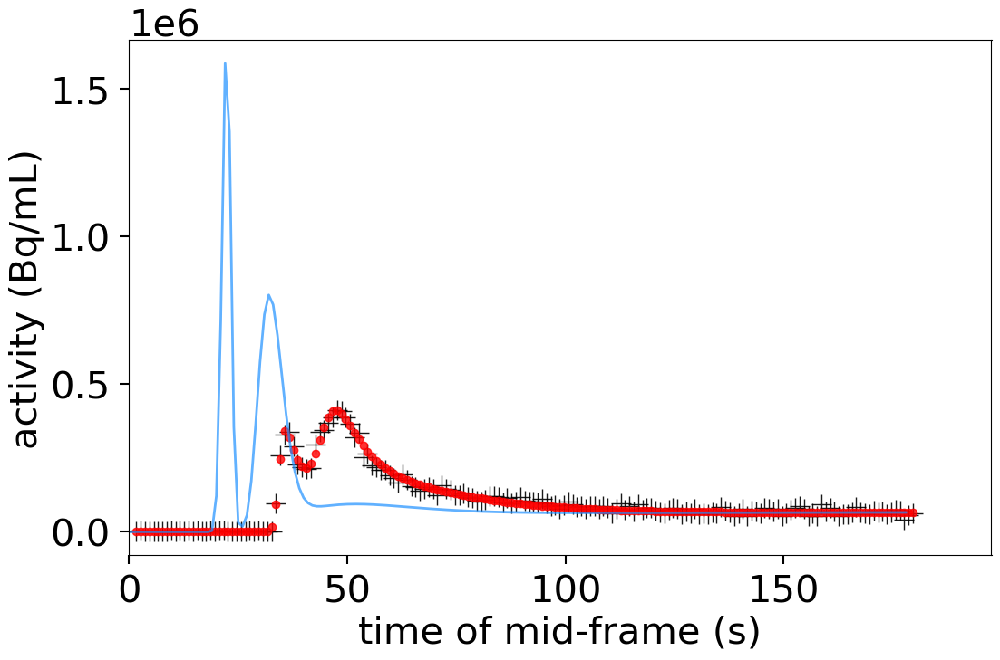

In [19]:
ra.plot_truths(ra.truths)

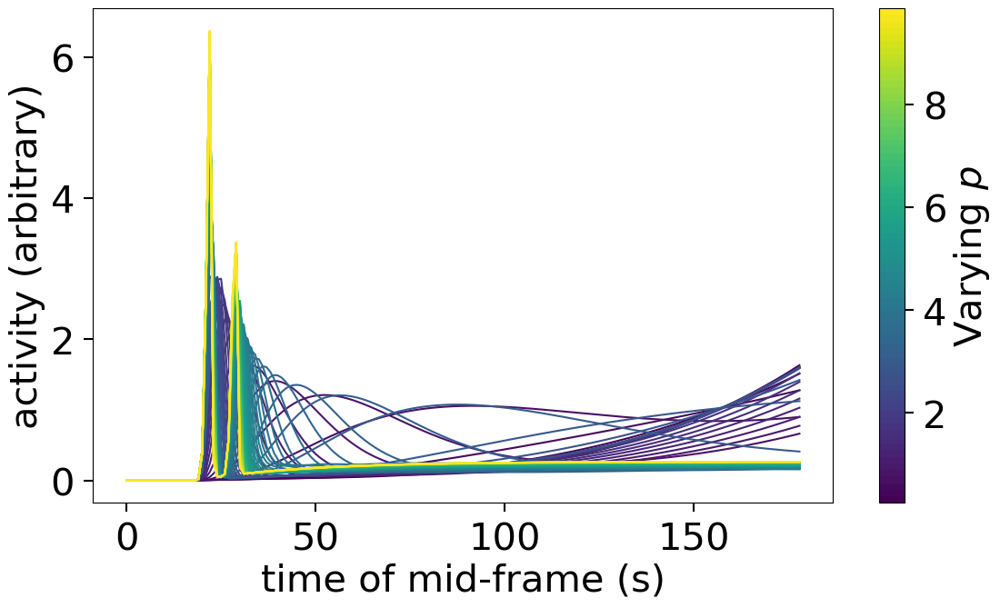

In [20]:
ra.plot_variations(tindex=5, tmin=0.25, tmax=10)

Let's sample from this distribution using the default `dynesty` settings with `'slice'`.

iter: 70676 | batch: 0 | bound: 156 | nc: 1 | ncall: 6310613 | eff(%):  1.120 | loglstar:   -inf < 407.887 <    inf | logz: 354.618 +/-  0.196 | dlogz:  0.000 >  0.010                               

Parameter 0: 18.165 [15.744, 19.370]
Parameter 1: 6.406 [3.940, 7.693]
Parameter 2: 6.847 [0.355, 15.821]
Parameter 3: 4.540 [2.365, 9.986]
Parameter 4: 3.996 [2.375, 6.298]
Parameter 5: 3.874 [2.274, 7.410]
Parameter 6: -2.243 [-5.376, -0.999]
Parameter 7: -0.733 [-1.088, -0.480]
Parameter 8: 29.272 [8.459, 70.193]
Parameter 9: 0.319 [0.292, 0.344]
Parameter 10: 0.020 [0.013, 0.027]
Parameter 11: 0.041 [0.036, 0.046]
Parameter 12: 2.370 [0.597, 4.395]
Parameter 13: 0.026 [0.023, 0.029]
Parameter 0: 18.165 [15.744, 19.370]
Parameter 1: 6.406 [3.940, 7.693]
Parameter 2: 6.847 [0.355, 15.821]
Parameter 3: 4.540 [2.365, 9.986]
Parameter 4: 3.996 [2.375, 6.298]
Parameter 5: 3.874 [2.274, 7.410]
Parameter 6: -2.243 [-5.376, -0.999]
Parameter 7: -0.733 [-1.088, -0.480]
Parameter 8: 29.272 [8.459, 70.193]
Parameter 9: 0.319 [0.292, 0.344]
Parameter 10: 0.020 [0.013, 0.027]
Parameter 11: 0.041 [0.036, 0.046]
Parameter 12: 2.370 [0.597, 4.395]
Parameter 13: 0.026 [0.023, 0.029]


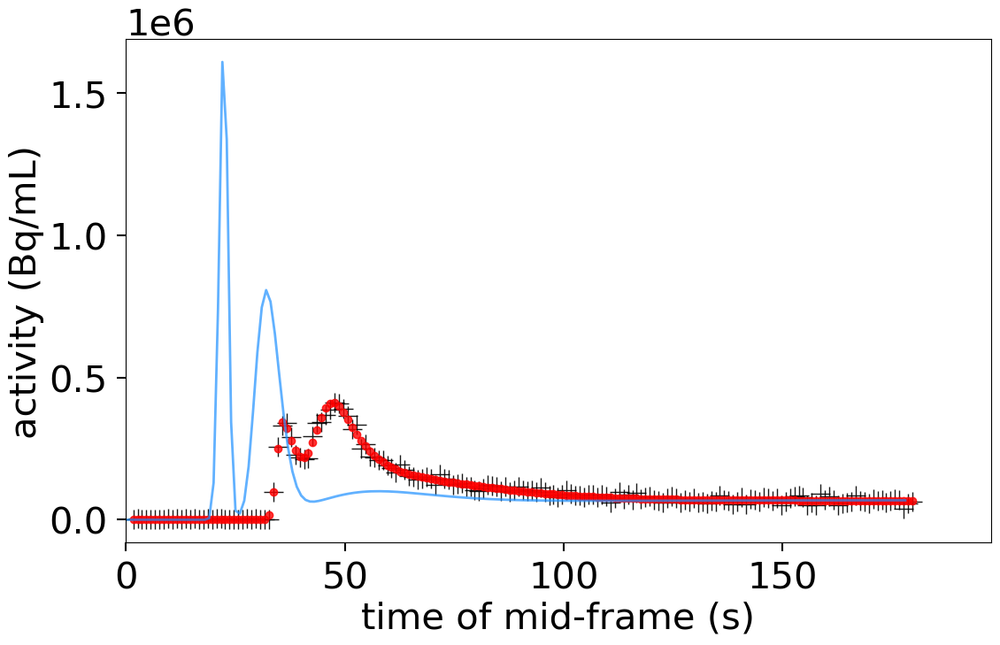

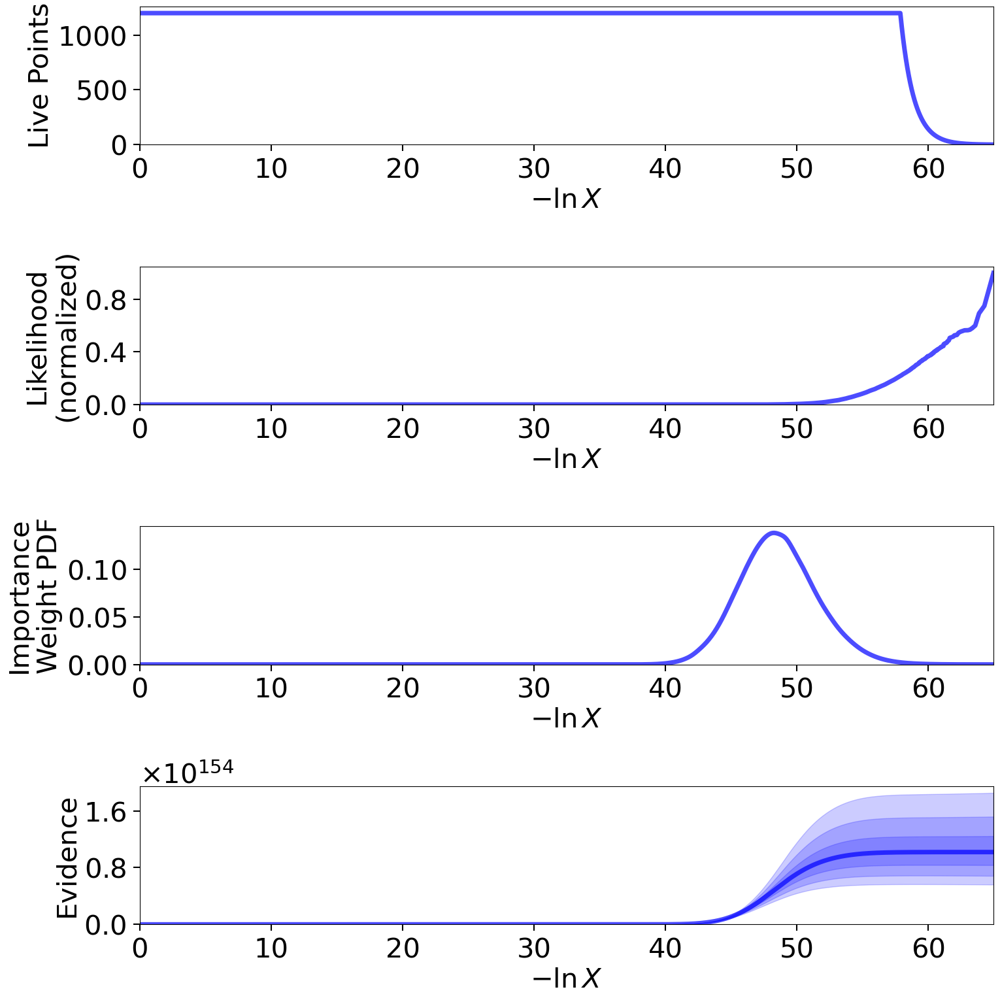

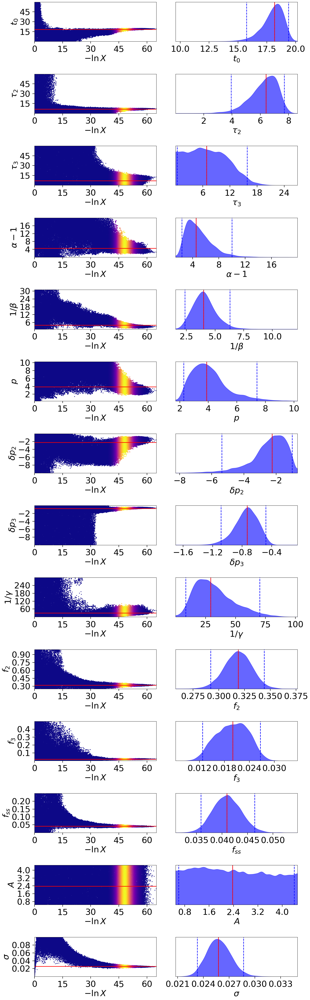

In [21]:
# de novo
res = ra.run_nested(print_progress=True)

# restart
# sampler = dynesty.DynamicNestedSampler.restore(bc.fqfp+"_dynesty-Boxcar-20240122210738.save")
# sampler.run_nested(resume=True)
# res = sampler.results

## Inspect RadialArtery2

In [35]:
v = ra2.truths
pprint("===================================== v ======================================")
pprint(v)

data = ra2.data(v)
pprint("==================================== data ====================================")
pprint(data)

'===================================== v ======================================'
[10.5756313279928,
 0.713140173417866,
 39.1199089354532,
 0.00422697891022531,
 22.9474753108535,
 5.12522018463992,
 -3.40318891251864,
 -6.07399977889612,
 194.006360580422,
 0.431590915291046,
 0.140522042844302,
 0.0656681046029573,
 2.37973890183483,
 0.0281236042969042]
'==================================== data ===================================='
{'halflife': 122.2416,
 'kernel': array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00474594, 0.10643181, 0.08525183, 0.07242634, 0.06271453,
       0.05503421, 0.04877346, 0.04355563, 0.03913338, 0.03533594,
       0.03204061, 0.02915633, 0.0266137 , 0.02435865, 0.02234826,
       0.02054791, 0.01892928, 0.01746894, 0.01614732, 0.0149479 ,
       0.01385661, 0.01286143, 0.01195198, 0.01111926, 0.01035544,
       0.00965365, 0.00900786, 0.00841273, 0.00786356, 0.

In [36]:
pprint("============================== ra2.data2t(data) ===============================")
pprint(ra2.data2t(data))
pprint("============================= ra2.data2taus(data) =============================")
pprint(ra2.data2taus(data))
pprint("=========================== ra2.data2timesMid(data) ===========================")
pprint(ra2.data2timesMid(data))
pprint("================================== ra2.fqfp ===================================")
pprint(ra2.fqfp)
pprint("========================== ra2.input_func_measurement =========================")
pprint(ra2.input_func_measurement)
pprint("================================= ra2.labels ==================================")
pprint(ra2.labels)
pprint("====================== ra2.load_nii(ra2.fqfp + '.nii.gz') ======================")
pprint(ra2.load_nii(ra2.fqfp + ".nii.gz"))
pprint("=============================== ra2.loglike(v) ================================")
pprint(ra2.loglike(v))
pprint("================================== ra2.ndim ===================================")
pprint(ra2.ndim)
pprint("========================= ra2.parse_halflife(ra2.fqfp) =========================")
pprint(ra2.parse_halflife(ra2.fqfp))
pprint("========================= ra2.parse_isotope(ra2.fqfp) ==========================")
pprint(ra2.parse_isotope(ra2.fqfp))
pprint("================================== ra2.sigma ==================================")
pprint(ra2.sigma)
pprint("============================ ra2.signalmodel(data) ============================")
pprint(ra2.signalmodel(data))

('============================== ra2.data2t(data) '
 '===============================')
array([-1.8500e+00, -8.5000e-01,  1.5000e-01,  1.1500e+00,  2.1500e+00,
        3.1500e+00,  4.1500e+00,  5.1500e+00,  6.1500e+00,  7.1500e+00,
        8.1500e+00,  9.1500e+00,  1.0150e+01,  1.1150e+01,  1.2150e+01,
        1.3150e+01,  1.4150e+01,  1.5150e+01,  1.6150e+01,  1.7150e+01,
        1.8150e+01,  1.9150e+01,  2.0150e+01,  2.1150e+01,  2.2150e+01,
        2.3150e+01,  2.4150e+01,  2.5150e+01,  2.6150e+01,  2.7150e+01,
        2.8150e+01,  2.9150e+01,  3.0150e+01,  3.1150e+01,  3.2150e+01,
        3.3150e+01,  3.4150e+01,  3.5150e+01,  3.6150e+01,  3.7150e+01,
        3.8150e+01,  3.9150e+01,  4.0150e+01,  4.1150e+01,  4.2150e+01,
        4.3150e+01,  4.4150e+01,  4.5150e+01,  4.6150e+01,  4.7150e+01,
        4.8150e+01,  4.9150e+01,  5.0150e+01,  5.1150e+01,  5.2150e+01,
        5.3150e+01,  5.4150e+01,  5.5150e+01,  5.6150e+01,  5.7150e+01,
        5.8150e+01,  5.9150e+01,  6.0150e+01,  6

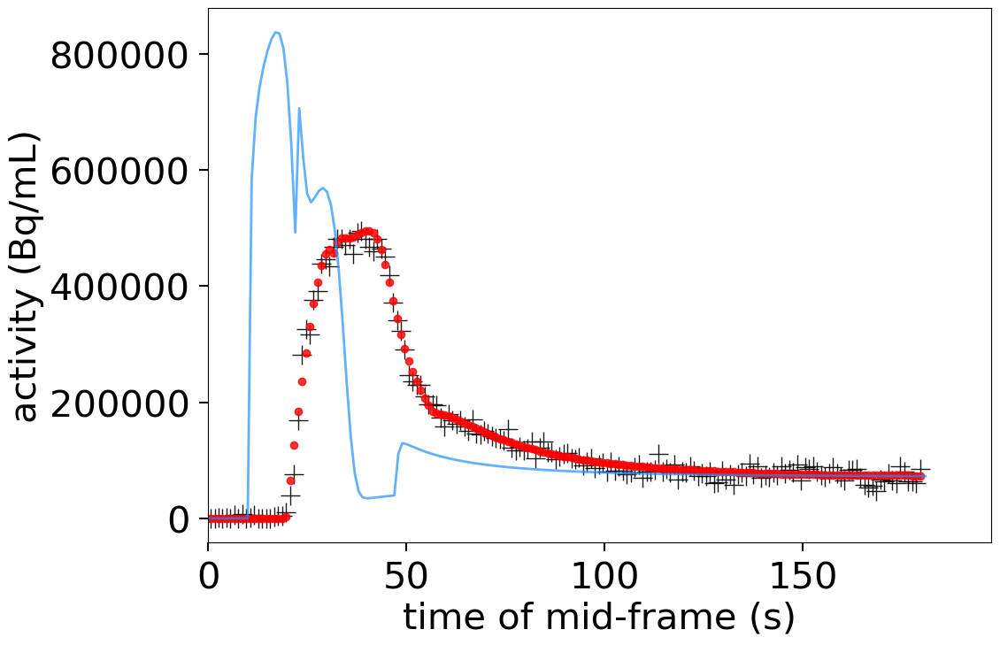

In [41]:
ra2.plot_truths(ra2.truths)

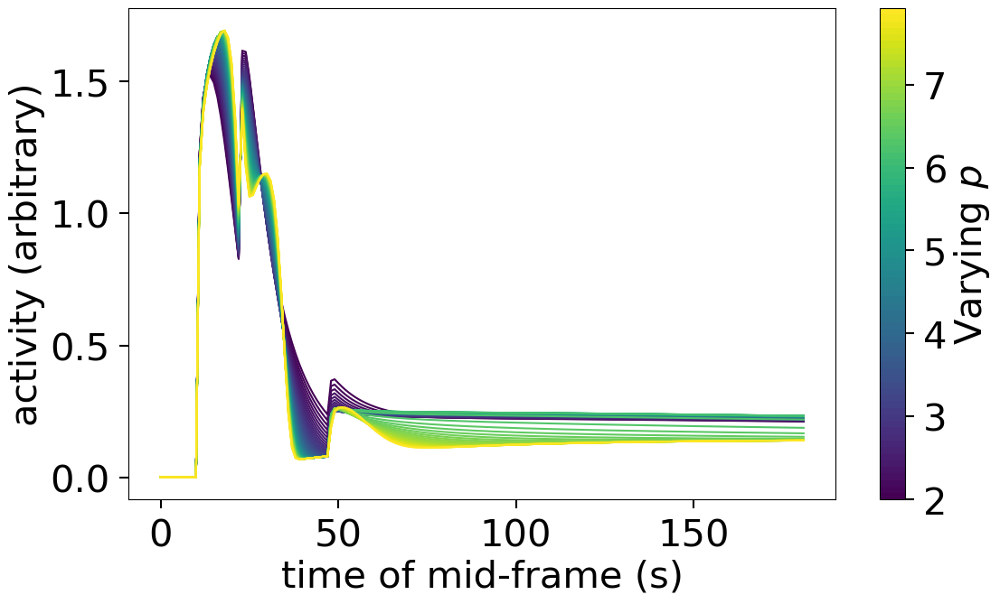

In [42]:
ra2.plot_variations(tindex=5, tmin=2, tmax=8)

Let's sample from this distribution using the default `dynesty` settings with `'slice'`.

iter: 3000 | batch: 0 | bound: 0 | nc: 1 | ncall: 3598 | eff(%): 25.867 | loglstar:   -inf < -15307.643 <    inf | logz: -15317.699 +/-  0.035 | dlogz: 15459.566 >  0.010                            IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

iter: 8210 | batch: 0 | bound: 0 | nc: 2 | ncall: 14182 | eff(%): 37.012 | loglstar:   -inf < -3494.813 <    inf | logz: -3504.726 +/-  0.033 | dlogz: 3641.863 >  0.010                              IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerAp

Parameter 0: 10.613 [10.023, 10.996]
Parameter 1: 11.993 [11.636, 12.414]
Parameter 2: 25.356 [19.965, 29.964]
Parameter 3: 0.130 [0.056, 0.275]
Parameter 4: 12.183 [11.561, 13.162]
Parameter 5: 6.551 [4.235, 9.743]
Parameter 6: -0.834 [-3.584, -0.034]
Parameter 7: -5.127 [-9.508, -2.801]
Parameter 8: 44.446 [10.651, 279.922]
Parameter 9: 0.378 [0.351, 0.409]
Parameter 10: 0.058 [0.036, 0.085]
Parameter 11: 0.077 [0.004, 0.087]
Parameter 12: 2.398 [0.586, 4.395]
Parameter 13: 0.024 [0.022, 0.027]
Parameter 0: 10.613 [10.023, 10.996]
Parameter 1: 11.993 [11.636, 12.414]
Parameter 2: 25.356 [19.965, 29.964]
Parameter 3: 0.130 [0.056, 0.275]
Parameter 4: 12.183 [11.561, 13.162]
Parameter 5: 6.551 [4.235, 9.743]
Parameter 6: -0.834 [-3.584, -0.034]
Parameter 7: -5.127 [-9.508, -2.801]
Parameter 8: 44.446 [10.651, 279.922]
Parameter 9: 0.378 [0.351, 0.409]
Parameter 10: 0.058 [0.036, 0.085]
Parameter 11: 0.077 [0.004, 0.087]
Parameter 12: 2.398 [0.586, 4.395]
Parameter 13: 0.024 [0.022, 0.0

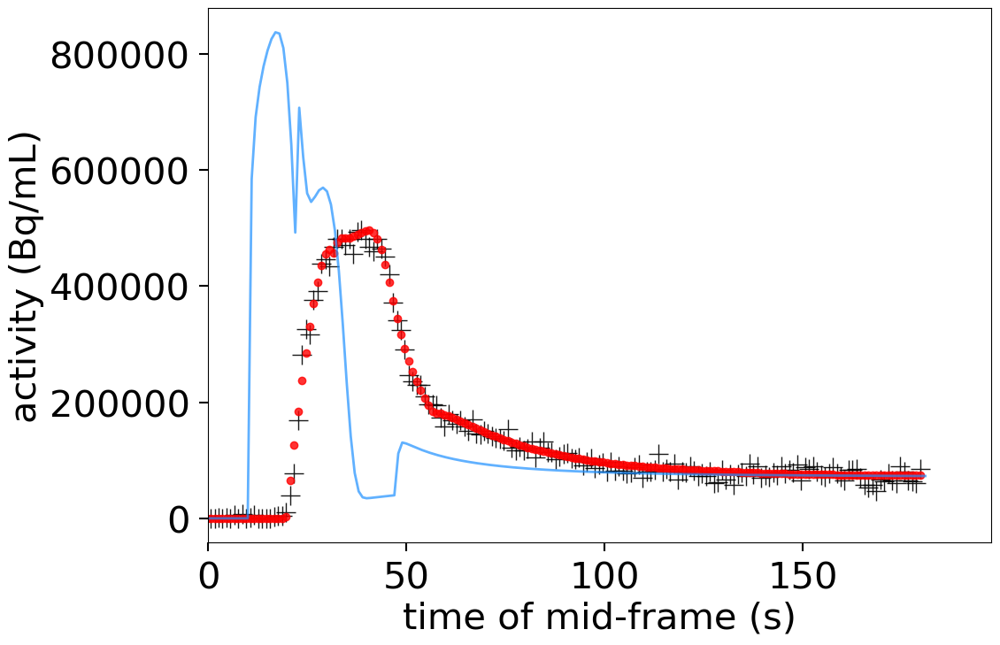

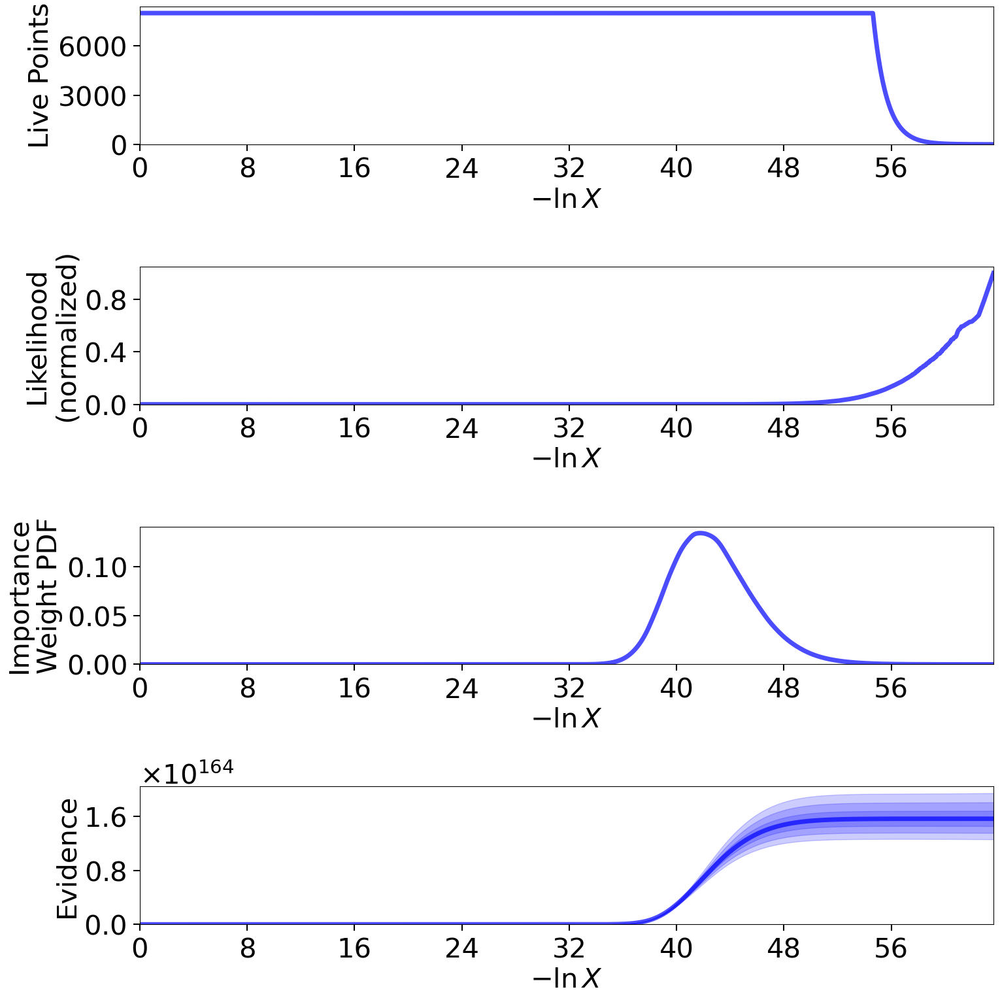

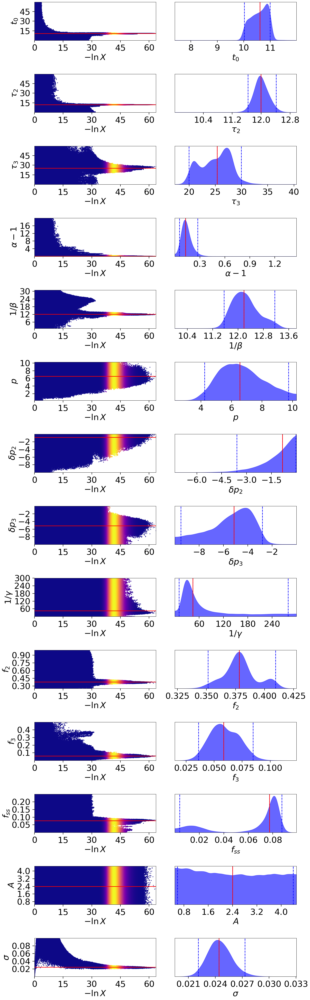

In [39]:
# de novo
res2 = ra2.run_nested(print_progress=True)

# restart
# sampler = dynesty.DynamicNestedSampler.restore(bc.fqfp+"_dynesty-Boxcar-20240122210738.save")
# sampler.run_nested(resume=True)
# res = sampler.results